## Deep Learning Approach to Recommender Systems

In this notebook, we will look into developing a Deep Learning model to address Business Case 4.

Stay tuned!

In [1]:
#Need to run this cell in order to be able to run Keras with GPU

import os
os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
#
#Check Computer's available devices
#Will need to check in the future
import tensorflow as tf
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

#cfg 1
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)

    except RuntimeError as e:
        print(e)

#cfg2
config = tf.compat.v1.ConfigProto(gpu_options = tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.8))
# device_count = {'GPU': 1})
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 7433394791838304230
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 11150080286323982281
physical_device_desc: "device: XLA_CPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4971491488
locality {
  bus_id: 1
  links {
  }
}
incarnation: 7982880290096009836
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 6976372250522379296
physical_device_desc: "device: XLA_GPU device"
]


In [2]:
#base libraries
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import random
%matplotlib inline
from timeit import default_timer as timer
from tensorflow import keras
import squarify
from pprint import pprint 
from time import time
import pickle
import heapq
#image manipulation packages

import nltk
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import stopwords
nltk.download('stopwords')

import cv2
from tqdm import tqdm
from sklearn.metrics import confusion_matrix,classification_report

# Callbacks
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau

#ALS
from scipy.sparse import coo_matrix
from implicit.als import AlternatingLeastSquares
from implicit.evaluation import ranking_metrics_at_k

#MAtrix Factorization
from keras.models import Model
from keras.layers import Input
from keras.layers.core import Reshape, Flatten
from keras.layers.merge import Multiply, multiply, Concatenate
from keras.layers.merge import Dot
from keras.layers.embeddings import Embedding
from keras import optimizers
from keras.regularizers import l2
from keras import initializers
from keras.optimizers import Adagrad, Adam, SGD, RMSprop, Adadelta
from keras import backend as K

import warnings
warnings.filterwarnings('ignore')

sns.set()

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Ricardo Santos\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to C:\Users\Ricardo
[nltk_data]     Santos\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
#Load files
PATH = './CSVs/'
transaction = pd.read_csv(PATH + 'transactions.csv')
del transaction['Unnamed: 0']

In [4]:
transaction

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Month,Day,Hour,Sales,Frequency,total_product_purchases,category,sub_category,full_categ
0,536365,85123a,white hanging heart tlight holder,6.0,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,12,1,8,15.30,35,122.0,heart,holder,holder heart
1,536373,85123a,white hanging heart tlight holder,6.0,2010-12-01 09:02:00,2.55,17850.0,United Kingdom,12,1,9,15.30,35,122.0,heart,holder,holder heart
2,536375,85123a,white hanging heart tlight holder,6.0,2010-12-01 09:32:00,2.55,17850.0,United Kingdom,12,1,9,15.30,35,122.0,heart,holder,holder heart
3,536396,85123a,white hanging heart tlight holder,6.0,2010-12-01 10:51:00,2.55,17850.0,United Kingdom,12,1,10,15.30,35,122.0,heart,holder,holder heart
4,536406,85123a,white hanging heart tlight holder,8.0,2010-12-01 11:33:00,2.55,17850.0,United Kingdom,12,1,11,20.40,35,122.0,heart,holder,holder heart
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525624,581578,22993,set of 4 pantry jelly moulds,12.0,2011-12-09 12:16:00,1.25,12713.0,Germany,12,9,12,15.00,1,12.0,pantry,other,other pantry
525625,581578,22907,pack of 20 napkins pantry design,12.0,2011-12-09 12:16:00,0.85,12713.0,Germany,12,9,12,10.20,1,12.0,pack,pantry,pantry pack
525626,581578,22908,pack of 20 napkins red apples,12.0,2011-12-09 12:16:00,0.85,12713.0,Germany,12,9,12,10.20,1,12.0,pack,napkins,napkins pack
525627,581578,23215,jingle bell heart antique silver,12.0,2011-12-09 12:16:00,2.08,12713.0,Germany,12,9,12,24.96,1,12.0,heart,silver,silver heart


In [5]:
#general info
transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525629 entries, 0 to 525628
Data columns (total 17 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   InvoiceNo                525629 non-null  int64  
 1   StockCode                525629 non-null  object 
 2   Description              525629 non-null  object 
 3   Quantity                 525629 non-null  float64
 4   InvoiceDate              525629 non-null  object 
 5   UnitPrice                525629 non-null  float64
 6   CustomerID               525629 non-null  float64
 7   Country                  525629 non-null  object 
 8   Month                    525629 non-null  int64  
 9   Day                      525629 non-null  int64  
 10  Hour                     525629 non-null  int64  
 11  Sales                    525629 non-null  float64
 12  Frequency                525629 non-null  int64  
 13  total_product_purchases  525629 non-null  float64
 14  cate

In [6]:
transaction.isna().sum()

InvoiceNo                  0
StockCode                  0
Description                0
Quantity                   0
InvoiceDate                0
UnitPrice                  0
CustomerID                 0
Country                    0
Month                      0
Day                        0
Hour                       0
Sales                      0
Frequency                  0
total_product_purchases    0
category                   0
sub_category               0
full_categ                 0
dtype: int64

In [7]:
transaction.describe(include = 'all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Month,Day,Hour,Sales,Frequency,total_product_purchases,category,sub_category,full_categ
count,525629.000000,525629,525629,525629.000000,525629,525629.000000,525629.000000,525629,525629.000000,525629.000000,525629.000000,525629.000000,525629.000000,525629.000000,525629,525629,525629
unique,NaN,3394,3394,NaN,17743,NaN,NaN,38,NaN,NaN,NaN,NaN,NaN,NaN,387,701,1841
top,NaN,85123a,white hanging heart tlight holder,NaN,2011-10-31 14:41:00,NaN,NaN,United Kingdom,NaN,NaN,NaN,NaN,NaN,NaN,bag,other,sign metal
freq,NaN,2319,2319,NaN,1105,NaN,NaN,481982,NaN,NaN,NaN,NaN,NaN,NaN,42530,39616,14919
mean,560002.141335,NaN,NaN,10.177977,NaN,3.256180,11132.296917,NaN,7.562513,15.020503,13.075740,18.809438,17.132786,31.561963,NaN,NaN,NaN
std,13427.318825,NaN,NaN,35.203787,NaN,4.122726,7425.378212,NaN,3.507441,8.661974,2.437845,63.601276,39.607393,183.640190,NaN,NaN,NaN
min,536365.000000,NaN,NaN,1.000000,NaN,0.040000,-3243.000000,NaN,1.000000,1.000000,6.000000,0.060000,1.000000,-72.000000,NaN,NaN,NaN
25%,547921.000000,NaN,NaN,1.000000,NaN,1.250000,12360.000000,NaN,5.000000,7.000000,11.000000,3.750000,1.000000,2.000000,NaN,NaN,NaN
50%,560727.000000,NaN,NaN,3.000000,NaN,2.080000,14401.000000,NaN,8.000000,15.000000,13.000000,9.900000,5.000000,6.000000,NaN,NaN,NaN
75%,571883.000000,NaN,NaN,11.000000,NaN,4.130000,16279.000000,NaN,11.000000,22.000000,15.000000,17.400000,14.000000,18.000000,NaN,NaN,NaN


In [8]:
#create dictionary to use later

im_handy = transaction.set_index('StockCode').to_dict()['Description']

### After checking if everything is correct, it's time to test models

#### Checking customers, products and other important elements.

In [9]:
print(f'Number of Clients: {transaction.CustomerID.nunique()}')
print(f'Number of Transactions: {transaction.InvoiceNo.nunique()}')

Number of Clients: 5102
Number of Transactions: 19101


In [10]:
print(f'Top 5: Most Interacted with products:\n{transaction.Description.value_counts()[:6]}\n')
print(f'Top5: Less Interacted with produts:\n{transaction.Description.value_counts()[-5:]}')

Top 5: Most Interacted with products:
white hanging heart tlight holder    2319
jumbo bag red retrospot              2098
regency cakestand 3 tier             2005
party bunting                        1700
lunch bag red retrospot              1595
assorted colour bird ornament        1486
Name: Description, dtype: int64

Top5: Less Interacted with produts:
purple gemstone necklace 45cm          5
white vintage crystal bracelet         5
wooden box advent calendar             4
midnight blue drop crystal necklace    4
wrap summer rose design                4
Name: Description, dtype: int64


### Data Exploration

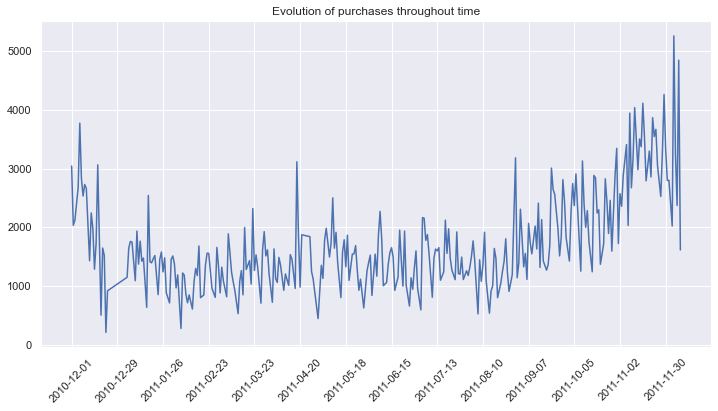

In [11]:
# Visualize number of events per day
data = pd.DatetimeIndex(transaction['InvoiceDate']).normalize().value_counts().sort_index()
fig = plt.figure(figsize=(12,6))
plt.plot(data.index, data.values, linestyle="-")
plt.xticks(np.arange(data.index[0], data.index[-1], pd.to_timedelta(4, unit='w')), rotation=45)
plt.title('Evolution of purchases throughout time')
plt.show()

In [12]:
# How many weeks does the dataset has?
diff = (data.index.max() - data.index.min())
print(f"The dataset has {diff.days} days, corresponding to {diff.days//7} weeks.")

The dataset has 373 days, corresponding to 53 weeks.


### Implicit reccomender application - model selection:

Splitting Data between train and test.

In this section, I hope that I don't just randomly split the training/testing sets into 9:1.
Rather, I will select those users with over 5 click times and pick the last click as the testing set.

In [13]:
#credit to https://github.com/TeddyWang0202/recommendation_system/blob/master/CF.ipynb

def train_test_split_time(df , columns_1 , columns_2 , columns_time , ratio = 0.9):
    '''
    we will use the columns_1 as the first level index
    sort the columns_2 as the target by columns_time
    '''
    
    retreive_name = df[columns_1].value_counts()[df[columns_1].value_counts()>5].keys()
    df_test = df[df[columns_1].isin(retreive_name)]
    df_test = df_test.sort_values(columns_time).groupby(columns_1).tail(1)
    df_train = df.drop(index=df_test.index)
    
    if df_test.shape[0] + df_train.shape[0] == df.shape[0]:
        print('train_test_split succeed!! with df_train shape:(%d,%d), df_test shape:(%d,%d)'
              %(df_train.shape[0],df_train.shape[1],df_test.shape[0],df_test.shape[1])
             )
        return df_train, df_test, retreive_name
    else:
        print('Oops, something wrong, with df_train shape : (%d,%d), df_test shape : (%d,%d)'
              %(df_train.shape[0],df_train.shape[1],df_test.shape[0],df_test.shape[1])
             )
        print('df_shape : (%d,%d)'
              %(df.shape[0],df.shape[1])
             )

In [14]:
#Split, for each customer it will look to prodict the last product purchased

df_train,df_test, retrieve = train_test_split_time(transaction,'CustomerID','StockCode', 'InvoiceDate')

train_test_split succeed!! with df_train shape:(520624,17), df_test shape:(5005,17)


In [15]:
df_train.describe(include = 'all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Month,Day,Hour,Sales,Frequency,total_product_purchases,category,sub_category,full_categ
count,520624.000000,520624,520624,520624.000000,520624,520624.000000,520624.000000,520624,520624.000000,520624.000000,520624.000000,520624.000000,520624.000000,520624.000000,520624,520624,520624
unique,NaN,3394,3394,NaN,17581,NaN,NaN,38,NaN,NaN,NaN,NaN,NaN,NaN,387,701,1841
top,NaN,85123a,white hanging heart tlight holder,NaN,2011-10-31 14:41:00,NaN,NaN,United Kingdom,NaN,NaN,NaN,NaN,NaN,NaN,bag,other,sign metal
freq,NaN,2286,2286,NaN,1104,NaN,NaN,477416,NaN,NaN,NaN,NaN,NaN,NaN,42173,39249,14804
mean,559942.932051,NaN,NaN,10.126537,NaN,3.254420,11124.022554,NaN,7.551411,15.020122,13.078709,18.726555,17.254704,31.563664,NaN,NaN,NaN
std,13417.746019,NaN,NaN,34.759184,NaN,4.114073,7429.803037,NaN,3.508451,8.659063,2.437557,63.091816,39.768779,182.920950,NaN,NaN,NaN
min,536365.000000,NaN,NaN,1.000000,NaN,0.040000,-3243.000000,NaN,1.000000,1.000000,6.000000,0.060000,1.000000,-72.000000,NaN,NaN,NaN
25%,547895.000000,NaN,NaN,1.000000,NaN,1.250000,12359.000000,NaN,5.000000,7.000000,11.000000,3.750000,1.000000,2.000000,NaN,NaN,NaN
50%,560635.000000,NaN,NaN,3.000000,NaN,2.080000,14400.000000,NaN,8.000000,15.000000,13.000000,9.900000,5.000000,6.000000,NaN,NaN,NaN
75%,571748.000000,NaN,NaN,10.000000,NaN,4.130000,16279.000000,NaN,11.000000,22.000000,15.000000,17.400000,14.000000,18.000000,NaN,NaN,NaN


In [16]:
df_test.describe(include = 'all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Month,Day,Hour,Sales,Frequency,total_product_purchases,category,sub_category,full_categ
count,5005.000000,5005,5005,5005.000000,5005,5005.000000,5005.000000,5005,5005.000000,5005.000000,5005.000000,5005.000000,5005.000000,5005.000000,5005,5005,5005
unique,NaN,1769,1769,NaN,4759,NaN,NaN,38,NaN,NaN,NaN,NaN,NaN,NaN,269,485,1094
top,NaN,85123a,white hanging heart tlight holder,NaN,2011-05-10 15:07:00,NaN,NaN,United Kingdom,NaN,NaN,NaN,NaN,NaN,NaN,heart,other,sign metal
freq,NaN,33,33,NaN,5,NaN,NaN,4566,NaN,NaN,NaN,NaN,NaN,NaN,415,367,115
mean,566161.137263,NaN,NaN,15.528871,NaN,3.439207,11993.002597,NaN,8.717283,15.060140,12.766833,27.431023,4.450749,31.385015,NaN,NaN,NaN
std,12990.773131,NaN,NaN,66.685290,NaN,4.937785,6896.402852,NaN,3.196938,8.960399,2.448302,103.374239,8.594017,247.306428,NaN,NaN,NaN
min,536384.000000,NaN,NaN,1.000000,NaN,0.040000,-3243.000000,NaN,1.000000,1.000000,7.000000,0.190000,1.000000,-1.000000,NaN,NaN,NaN
25%,556427.000000,NaN,NaN,2.000000,NaN,1.250000,12700.000000,NaN,7.000000,7.000000,11.000000,5.900000,1.000000,2.000000,NaN,NaN,NaN
50%,570128.000000,NaN,NaN,6.000000,NaN,2.100000,14562.000000,NaN,10.000000,15.000000,13.000000,14.950000,2.000000,6.000000,NaN,NaN,NaN
75%,577329.000000,NaN,NaN,12.000000,NaN,4.150000,16407.000000,NaN,11.000000,23.000000,15.000000,20.800000,5.000000,16.000000,NaN,NaN,NaN


We will use the leave-one-out method to evaluate our testing data
Basically, we will generate N samples list that the test user hasn't read and add the ground truth into the list, and see how the recommendation system will score and rank the list

In [17]:
def get_sampling(df_target, df_source, numbers_of_N_sample, generate_negative = False):
    '''
    1.
    return: test_rating in the shape of [ [user,item ] * 3330 ]
    2.
    from the target dataframe, sampling the negative sample from source dataframe
    in this case yhe negative sample will be the entire dataset (kjust to confirm accuracy vs all)
    '''
    
    test_rating = df_target[['CustomerID','StockCode']].values.tolist()
    
    print('test_rating yield successfully!!!')
    
    if generate_negative == True:
        df_temp = df_source.drop_duplicates(subset = 'StockCode', keep = 'first')
        negative_test_rating = []
        for i in range(df_target.shape[0]):
            drop_id = test_rating[i][0]
            list_ = df_temp[df_temp['CustomerID'] != drop_id]['StockCode'].sample(numbers_of_N_sample).values.tolist()
            
            negative_test_rating.append([test_rating[i],list_])
        print('negative_test_rating yield successfully!!!')

        return test_rating, negative_test_rating
    else:
        return test_rating
    
test_rating = get_sampling(df_test,df_train,None)

test_rating yield successfully!!!


In [18]:
np.shape(test_rating)

(5005, 2)

In [19]:
#print('''Compares with all values''')

time1 = time()
test_rating, negative_test_rating = get_sampling(df_test,df_train,1768,True)
time2 = time()
print('Took for %d seconds' %(time2-time1))
with open("Negative_test_rating_1768N.txt","wb") as f: #in write mode
    pickle.dump(negative_test_rating,f)

test_rating yield successfully!!!
negative_test_rating yield successfully!!!
Took for 5 seconds


## Performance metrics

In [20]:
### Hit rate / NDCG
### reference : https://www.comp.nus.edu.sg/~xiangnan/papers/cikm15-trirank-cr.pdf

def getHitRatio(ranklist, gtItem):
    if gtItem in ranklist:
        return 1
    return 0

def getNDCG(ranklist, gtItem):
    ar = np.array(ranklist)
    if gtItem in ar:
        return math.log(2) / math.log(np.where(ar == gtItem)[0][0] + 2)
    return 0

In [21]:

def eval_one_rating(idx, eval_mode,uim):
    
    '''''
    eval_mode = 'Keras', 'ALS', 'matrix'
    '''''
    rating = _testRatings[idx]
    ### rating should be like (  [user_id,article_pid(only one article, which is ground truth)]  ) 
    items = _testNegatives[idx][1]
    ### items should be like (  [article_pid(19 ones, which are ones the reader haven't read)]  )
    u = rating[0]
    gtItem = rating[1]
    items.append(gtItem)
    
    # Get prediction scores, the process is we offer 100(99 negative + 1 ground truth) articles to one user in testing data, and predict the score(read or not) and ranking.
    map_item_score = {}
    users = np.full(len(items), u, dtype = 'int32')
    
    if eval_mode == 'ALS':
        predictions = _model.rank_items(u, uim.T, items)
        items.pop()
        ranklist = np.array(predictions, dtype = int)[:_K,0]
        
    else:
        if eval_mode == 'Keras':
            predictions = _model.predict([users, np.array(items)], 
                                         batch_size=100, verbose=0)
        elif eval_mode == 'matrix':         
            predictions = _model[u,items]


        for i in range(len(items)):
            item = items[i]
            map_item_score[item] = predictions[i]
        items.pop()
        
        # Evaluate top rank list
        ranklist = heapq.nlargest(_K, map_item_score, key=map_item_score.get)
        
    hr = getHitRatio(ranklist, gtItem)
    ndcg = getNDCG(ranklist, gtItem)
    return (hr, ndcg)

In [22]:
# Global variables that are shared across processes
_model = None
_testRatings = None
_testNegatives = None
_K = None

def evaluate_model(model, testRatings, testNegatives, K, num_thread, eval_mode = 'Keras', uim =None):
    """
    Evaluate the performance (Hit_Ratio, NDCG) of top-K recommendation
    Return: score of each test rating.
    """
    global _model
    global _testRatings
    global _testNegatives
    global _K
    _model = model
    _testRatings = testRatings
    _testNegatives = testNegatives
    _K = K
        
    hits, ndcgs = [],[]
    if(num_thread > 1): # Multi-thread
        pool = multiprocessing.Pool(processes=num_thread)
        res = pool.map(eval_one_rating, range(len(_testRatings)))
        pool.close()
        pool.join()
        hits = [r[0] for r in res]
        ndcgs = [r[1] for r in res]
        return (hits, ndcgs)
    else:# Single thread
        for idx in range(len(_testRatings)):
            (hr,ndcg) = eval_one_rating(idx, eval_mode, uim)
            hits.append(hr)
            ndcgs.append(ndcg)      
    return (hits, ndcgs)

# Implicit recomender application - model selection:

- Matrix Factorization
One popular recommender systems approach is called Matrix Factorisation. It works on the principle that we can learn a low-dimensional representation (embedding) of user and products. 

- Neural Deep Method

### Starting with Matrix Factorization


In [23]:
### In this part, we will first make the matrix to be: 1 if bought previously and 0 for never bought by customer 
df_train['bought'] = 1
df_test['bought'] = 1
df_train_group = df_train[['CustomerID', 'StockCode','bought']].groupby(by = ['CustomerID', 'StockCode'],as_index=False).sum()
df_test_group = df_test[['CustomerID', 'StockCode','bought']].groupby(by = ['CustomerID', 'StockCode'],as_index=False).sum()


### To feed into the keras model, we have to turn both the eruid and pid into integer index
prod_map = {i:v for i,v in enumerate(transaction.StockCode.unique())}
inverse_prod_map = {v:i for i,v in enumerate(transaction.StockCode.unique())}
customer_map = {i:v for i,v in enumerate(transaction.CustomerID.unique())}
inverse_customer_map = {v:i for i,v in enumerate(transaction.CustomerID.unique())}

In [24]:
df_train_group.shape

(391090, 3)

In [25]:
inverse_prod_map

{'85123a': 0,
 '71053': 1,
 '84406b': 2,
 '84029g': 3,
 '84029e': 4,
 '22752': 5,
 '21730': 6,
 '22633': 7,
 '22632': 8,
 '20679': 9,
 '37370': 10,
 '21871': 11,
 '21071': 12,
 '21068': 13,
 '82483': 14,
 '82486': 15,
 '82482': 16,
 '82494l': 17,
 '15056bl': 18,
 '22803': 19,
 '22411': 20,
 '84879': 21,
 '22745': 22,
 '22748': 23,
 '22749': 24,
 '22310': 25,
 '84969': 26,
 '22623': 27,
 '22622': 28,
 '21754': 29,
 '21755': 30,
 '21777': 31,
 '48187': 32,
 '22960': 33,
 '22913': 34,
 '22912': 35,
 '22914': 36,
 '21756': 37,
 '22274': 38,
 '16161p': 39,
 '22766': 40,
 '22708': 41,
 '23231': 42,
 '85015': 43,
 '85016': 44,
 '22829': 45,
 '22722': 46,
 '22961': 47,
 '22969': 48,
 '22720': 49,
 '22549': 50,
 '20972': 51,
 '22743': 52,
 '21658': 53,
 '48184': 54,
 '22692': 55,
 '22499': 56,
 '22607': 57,
 '47566': 58,
 '21902': 59,
 '21901': 60,
 '21899': 61,
 '21900': 62,
 '22077': 63,
 '23152': 64,
 '23182': 65,
 '23161': 66,
 '23160': 67,
 '23163': 68,
 '23162': 69,
 '23164': 70,
 '23177'

In [26]:
prod_map

{0: '85123a',
 1: '71053',
 2: '84406b',
 3: '84029g',
 4: '84029e',
 5: '22752',
 6: '21730',
 7: '22633',
 8: '22632',
 9: '20679',
 10: '37370',
 11: '21871',
 12: '21071',
 13: '21068',
 14: '82483',
 15: '82486',
 16: '82482',
 17: '82494l',
 18: '15056bl',
 19: '22803',
 20: '22411',
 21: '84879',
 22: '22745',
 23: '22748',
 24: '22749',
 25: '22310',
 26: '84969',
 27: '22623',
 28: '22622',
 29: '21754',
 30: '21755',
 31: '21777',
 32: '48187',
 33: '22960',
 34: '22913',
 35: '22912',
 36: '22914',
 37: '21756',
 38: '22274',
 39: '16161p',
 40: '22766',
 41: '22708',
 42: '23231',
 43: '85015',
 44: '85016',
 45: '22829',
 46: '22722',
 47: '22961',
 48: '22969',
 49: '22720',
 50: '22549',
 51: '20972',
 52: '22743',
 53: '21658',
 54: '48184',
 55: '22692',
 56: '22499',
 57: '22607',
 58: '47566',
 59: '21902',
 60: '21901',
 61: '21899',
 62: '21900',
 63: '22077',
 64: '23152',
 65: '23182',
 66: '23161',
 67: '23160',
 68: '23163',
 69: '23162',
 70: '23164',
 71: '23

In [27]:
### creating a mapping table for training data
df_train_group_map = df_train_group.copy()
df_test_group_map = df_test_group.copy()


df_train_group_map['CustomerID'] = df_train_group['CustomerID'].map(inverse_customer_map)
df_train_group_map['StockCode'] = df_train_group['StockCode'].map(inverse_prod_map)
df_test_group_map['CustomerID'] = df_test_group['CustomerID'].map(inverse_customer_map)
df_test_group_map['StockCode'] = df_test_group['StockCode'].map(inverse_prod_map)


### creating a mapping list for testing data   
test_rating_map = []
for i in range(len(test_rating)):
    test_rating_map.append([inverse_customer_map[test_rating[i][0]],inverse_prod_map[test_rating[i][1]]])


### creating a mapping list for negative testing data
negative_test_rating_map = []
for i in range(len(negative_test_rating)):
    negative_test_rating_map.append([
                                     [inverse_customer_map[negative_test_rating[i][0][0]],inverse_prod_map[negative_test_rating[i][0][1]]],
                                     list(map(lambda w:inverse_prod_map[w],negative_test_rating[i][1]))])

In [28]:
print('df_train_group_map shape: ',df_train_group_map.shape)
print('number of users: ', len(customer_map.items()))
print('number of items: ', len(prod_map.items()))
print('The sparse matrix is one with shape (%d , %d), with %d non-zero purchases'
      %(len(prod_map.items()),len(customer_map.items()),df_train_group_map.shape[0]))

df_train_group_map shape:  (391090, 3)
number of users:  5102
number of items:  3394
The sparse matrix is one with shape (3394 , 5102), with 391090 non-zero purchases


In [29]:
def get_model(num_users, num_items, latent_dim, regs=[0,0]):
    ### define placeholder.
    user_id_input = Input(shape=[1], name='user')
    item_id_input = Input(shape=[1], name='item')

    ### define embedding size and layers.

    user_embedding = Embedding(output_dim = latent_dim, input_dim = num_users,
                               input_length=1, name='user_embedding',
                               embeddings_regularizer = l2(regs[0]))(user_id_input)
    item_embedding = Embedding(output_dim = latent_dim, input_dim = num_items,
                               input_length=1, name='item_embedding',
                              embeddings_regularizer = l2(regs[1]))(item_id_input)

    user_vecs = Reshape([latent_dim])(user_embedding)
    item_vecs = Reshape([latent_dim])(item_embedding)

    ### The prediction, which we calculate the loss function with ground truth and optimize.
    y_hat = Dot(1, normalize=False)([user_vecs, item_vecs])

    model = Model(inputs=[user_id_input, item_id_input], outputs=y_hat)
    
    return model

In [30]:
import math

num_users = len(customer_map.items())
num_items = len(prod_map.items())
topK = 10
verbose = 0
latent_dim = 256
epochs = 100
batch_size = 4096
evaluation_threads = 1
best_hr, best_ndcg, best_iter = -1, -1, -1
model_out_file = 'models/GMF_%d_%d.h5' %(latent_dim, time())
testRatings, testNegatives = test_rating_map, negative_test_rating_map
learning_rate = 0.0005
model1 = get_model(num_users, num_items, latent_dim, regs=[0,0])
model1.compile(optimizer=Adam(lr=learning_rate), loss="mse") ### In this task, for label is 'timesbought'(integers)
                                                              #could also use units bought i think
hr_list = []
loss_list = []
patience = 5
early_stop =True


# Generate training instances
user_input, item_input, labels = df_train_group_map.CustomerID, df_train_group_map.StockCode, df_train_group_map.bought

for epoch in range(epochs):
    t1 = time()
        
    # Trainingon
    hist = model1.fit([np.array(user_input), np.array(item_input)], #input
                         np.array(labels), # labels 
                         validation_data = ( [df_test_group_map.CustomerID,df_test_group_map.StockCode],df_test_group_map.bought) ,
                         batch_size = batch_size,
                         epochs = 1, verbose = verbose, shuffle = True)
    t2 = time()
        
    # Evaluation
    (hits, ndcgs) = evaluate_model(model1, testRatings, testNegatives, topK, evaluation_threads)
    hr, ndcg, loss = np.array(hits).mean(), np.array(ndcgs).mean(), hist.history['val_loss'][0]    
    hr_list.append(hr)
    loss_list.append(loss)
    # Using patience to set the early stopping.
    # Always to save the model with minimun loss.
    if hr < np.max(hr_list):
        patience_count += 1
    else:
        patience_count = 0
        best_hr, best_ndcg, best_iter = hr, ndcg, epoch
        model1.save_weights(model_out_file, overwrite=True)
    if (early_stop) and (patience_count == patience):
        break
    if epoch % 1 == 0:
        print('Iteration %d [%.1f s]: HR = %.4f, NDCG = %.4f,val_loss = %.4f [%.1f s]' 
            % (epoch,  t2-t1, hr, ndcg, loss, time()-t2))
        
print("End. Best Iteration %d:  HR = %.4f, NDCG = %.4f. " %(best_iter, best_hr, best_ndcg))

Iteration 0 [3.5 s]: HR = 0.0104, NDCG = 0.0049,val_loss = 0.9947 [323.5 s]
Iteration 1 [1.2 s]: HR = 0.0587, NDCG = 0.0312,val_loss = 0.9114 [328.6 s]
Iteration 2 [1.1 s]: HR = 0.0709, NDCG = 0.0383,val_loss = 0.4212 [319.6 s]
Iteration 3 [1.1 s]: HR = 0.0635, NDCG = 0.0338,val_loss = 0.1456 [296.8 s]
Iteration 4 [1.1 s]: HR = 0.0559, NDCG = 0.0309,val_loss = 0.1712 [295.8 s]
Iteration 5 [1.3 s]: HR = 0.0547, NDCG = 0.0300,val_loss = 0.2167 [316.1 s]
Iteration 6 [1.1 s]: HR = 0.0569, NDCG = 0.0306,val_loss = 0.2556 [315.7 s]
End. Best Iteration 2:  HR = 0.0709, NDCG = 0.0383. 


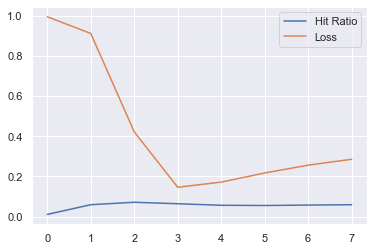

In [31]:
sns.set_style('darkgrid')
plt.plot(hr_list, label = 'Hit Ratio')
plt.plot(loss_list, label = 'Loss')
plt.legend()

In [32]:
model1.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
user (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
item (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
user_embedding (Embedding)      (None, 1, 256)       1306112     user[0][0]                       
__________________________________________________________________________________________________
item_embedding (Embedding)      (None, 1, 256)       868864      item[0][0]                       
______________________________________________________________________________________________

### Getting Reccomendations and computing 

In [33]:
def recommend(model, user_embed, item_embed, user_id, products=10):
    
    product_embedding_learnt = model.get_layer(name=item_embed).get_weights()[0]
    user_embedding_learnt = model.get_layer(name=user_embed).get_weights()[0]
    
    print(f'Getting reccomendations for user {customer_map[user_id].astype(str)}:\n\n'+ 
         f'-------------------------------------------------------------------------\n' +
         f'-------------------------------------------------------------------------\n')
    product = user_embedding_learnt[user_id]@product_embedding_learnt.T
    mids = np.argpartition(product, -products)[-products:]
    for i in mids:
        print(f'Item number {prod_map[i]}: {im_handy[prod_map[i]]}')
    print('\n_______________________________________________________________________\n\n')
    return mids

In [34]:
mids = []
for i in range(len(testRatings)):
    mids.append(recommend(model1, 'user_embedding', 'item_embedding', i))

Getting reccomendations for user 17850.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22726: alarm clock bakelike green
Item number 82482: wooden picture frame white finish
Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13047.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike 


Item number 23209: lunch bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 22386: jumbo bag pink polkadot
Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17548.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock b


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16583.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 207


Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15012.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 21034: rex cashcarry jumbo shopper
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colo


Item number 82486: wood s3 cabinet ant white finish
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18144.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item numbe


Item number 22423: regency cakestand 3 tier
Item number 82486: wood s3 cabinet ant white finish
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17760.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumb


Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17069.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22726: alarm clock bakelike green
Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  


Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17732.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82482: wooden picture frame white finish
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 850

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18041.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20727: lunch 


Item number 22727: alarm clock bakelike red
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12915.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17976.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22383: l


Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15640.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84879: assorted colour bird ornament
Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20727:


Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15646.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b

Getting reccomendations for user 16634.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18239.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22178: victorian glass hanging tlight
Item number 22383: lunch bag suki design
Item numb

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18225.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21931: jumbo storage bag suki
Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item


Item number 22386: jumbo bag pink polkadot
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14680.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black 

Item number 84879: assorted colour bird ornament
Item number 23203: jumbo bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 23209: lunch bag vintage doily
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14723.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retr

Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -3184.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: ju


Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16241.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retros


Item number 82482: wooden picture frame white finish
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 82486: wood s3 cabinet ant white finish
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13506.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospo


Item number 23203: jumbo bag vintage doily
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22386: jumbo bag pink polkadot
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14161.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo ba


Item number 22727: alarm clock bakelike red
Item number 82482: wooden picture frame white finish
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16143.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47566: party bunting
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch ba


Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17428.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 8


Item number 23203: jumbo bag vintage doily
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17691.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 82486: wood s3 cabinet ant white finish
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item numb

Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16898.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20728: lunch bag cars blue
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted c


Item number 21034: rex cashcarry jumbo shopper
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16710.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 

Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13481.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 23203: jumbo bag vintage doily
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13495.0:

----

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17450.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assor


Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18119.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock b


Item number 23203: jumbo bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13786.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot



Item number 22659: lunch box i love london
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 21034: rex cashcarry jumbo shopper
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -3145.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: ala


Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 21034: rex cashcarry jumbo shopper
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16863.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 23203: jumbo bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag re

Item number 22727: alarm clock bakelike red
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 21166: cook with wine metal sign
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15750.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lun


Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16893.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 221


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13113.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 23209: lunch bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20727: lunch


Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item number 22197: popcorn holder
Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15581.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder


Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13984.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 82486: wood s3 cabinet ant white finish
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird orname

Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18092.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red ret


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17526.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch b


Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17978.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red r


Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15192.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20726: lunch bag woodland
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22197: popco


Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15596.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
It


Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -3073.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22993: set of 4 pantry jelly moulds
Item number 22383: lunch bag suki design
Item number 82613b: metal signcupcake single hook
Item number 21166: cook with wine metal sign
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item 


Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14256.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17865.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21166: cook with wine metal sign
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted co


Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14577.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 21166: cook with wine metal sign
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: ass


Item number 22727: alarm clock bakelike red
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13959.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcor

Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14290.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: al

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 21034: rex cashcarry jumbo shopper
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16726.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197


Item number 22727: alarm clock bakelike red
Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -3057.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch


Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14961.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 2219


Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 82486: wood s3 cabinet ant white finish
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14415.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22386: jumbo bag pink polk

Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -3048.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -3047.0:

-------------------------------

Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12865.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15950.0:

--------------------------


Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 82486: wood s3 cabinet ant white finish
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16134.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20914:

Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22386: jumbo bag pink polkadot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12577.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

______________________________________________________________________


Item number 84879: assorted colour bird ornament
Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15246.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock

Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16746.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight hold


Item number 23209: lunch bag vintage doily
Item number 22197: popcorn holder
Item number 21931: jumbo storage bag suki
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15157.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item


Item number 22726: alarm clock bakelike green
Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18223.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo ba


Item number 23203: jumbo bag vintage doily
Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13004.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 2072


Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15204.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725


Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 82613b: metal signcupcake single hook
Item number 21166: cook with wine metal sign
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 21034: rex cashcarry jumbo shopper
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16885.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag s

Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 22386: jumbo bag pink polkadot
Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -3013.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 21137: black record cover frame
Item number 21034: rex cashcarry 


Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18097.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch b


Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22727: alarm clock bakelike red
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16270.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki 

Getting reccomendations for user -2974.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2973.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 2

Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13817.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 23203: jumbo bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 22383: lunch bag suki design


Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13680.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 21175: gin  tonic diet metal sign
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 21166: cook wi


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15661.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch b

Item number 20727: lunch bag  black skull
Item number 82482: wooden picture frame white finish
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 82486: wood s3 cabinet ant white finish
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15719.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag


Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15845.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22727: al


Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17707.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colou


Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15611.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red ret


Item number 22727: alarm clock bakelike red
Item number 23209: lunch bag vintage doily
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13565.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assor


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14321.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 20725: lunc


Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12601.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot


Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12728.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 207


Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16554.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 82486: wood s3 cabinet ant white finish
Item number 22197: popcorn holder
Item number 82482: wooden picture frame white finish
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: ala


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13284.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 21931: jumbo storage bag suki
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag

Item number 22197: popcorn holder
Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2868.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 21166: cook with wine metal sign
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 21034: rex cashcarry jumbo shopper
Item number 82613b: metal signcupcake single hook
Item number 85123a: wh


Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 21931: jumbo storage bag suki
Item number 20725: lunch bag red retrospot
Item number 22386: jumbo bag pink polkadot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15213.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike 


Item number 82486: wood s3 cabinet ant white finish
Item number 82482: wooden picture frame white finish
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13048.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22386: jumbo ba


Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 82486: wood s3 cabinet ant white finish
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17988.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lun


Item number 22386: jumbo bag pink polkadot
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2856.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21137: black record cover frame
Item number 22383: lunch bag suki design
Item number 22993: set of 4 pantry jelly moulds
Item number 22726: alarm clock bakelike green
Item number 21166: cook with wine metal sign
Item number 21034: rex cashcarry jumbo shopper
Item number

Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2849.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_____________________________________________________________


Getting reccomendations for user 17708.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15606.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 84


Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16321.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: pop


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12594.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84879: assorted colour bird ornament
Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retr


Item number 20914: set5 red retrospot lid glass bowls
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 82613b: metal signcupcake single hook
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17889.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item num


Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2821.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch 


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15820.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunc

Getting reccomendations for user 14130.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15222.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 23209: lunch bag vintage doily
Item 


Item number 22726: alarm clock bakelike green
Item number 21931: jumbo storage bag suki
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 23203: jumbo bag vintage doily
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18008.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot



Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13002.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch b


Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12591.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcor

Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12764.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo 


Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13328.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22727: alarm clock bakelike red
Item numbe


Item number 23203: jumbo bag vintage doily
Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13141.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20727: lunch bag  black sk


Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17463.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 82486: wood s3 cabinet ant white finish
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item numbe


Item number 21931: jumbo storage bag suki
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14776.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki de


Item number 21034: rex cashcarry jumbo shopper
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17356.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item num


_______________________________________________________________________


Getting reccomendations for user 12373.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20724: red retrospot charlotte bag
Item number 22726: alarm clock bakelike green
Item number 21931: jumbo storage bag suki
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20726: lunch bag woodland
Item number 85123a: white hanging heart tlight holder
Item number 85099b: jumbo bag red retrospot

_______________________________________________________________________


Getting reccomendations for user 18202.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink p

Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2702.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user


Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15270.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 82486: wood s3 cabinet ant white finish
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item 

Item number 82486: wood s3 cabinet ant white finish
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17362.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item n


Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13208.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 


Item number 82486: wood s3 cabinet ant white finish
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13309.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20726: lunch bag woodland
Item number 23209: lunch bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22

Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14410.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_________________

Item number 82482: wooden picture frame white finish
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15797.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch 

Getting reccomendations for user 15843.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82482: wooden picture frame white finish
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17083.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament

Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17686.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22197: popcorn holder
Item number 21931: jumbo storage bag suki
Item number 20727: lunch bag  black skull
Item number 23203: jumbo bag vintage doily
Item number 85099b: jumbo bag red retrospot
Item number 22386: jumbo bag pink polkadot
Ite

Item number 20914: set5 red retrospot lid glass bowls
Item number 20725: lunch bag red retrospot
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17705.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22727: alarm clock bakelike red
Item number 85099b: 

Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16084.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popco


Item number 23209: lunch bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 22386: jumbo bag pink polkadot
Item number 23203: jumbo bag vintage doily
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14644.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retro


Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 20726: lunch bag woodland
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16317.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag r

Getting reccomendations for user 12823.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12352.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colou


Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13018.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch ba

Item number 22384: lunch bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12852.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo b

Item number 82486: wood s3 cabinet ant white finish
Item number 22726: alarm clock bakelike green
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13301.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22

Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22423: regency cakestand 3 tier
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12365.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: ass

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12845.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725:


Item number 82486: wood s3 cabinet ant white finish
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13453.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82482: wooden picture frame white finish
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item 


Item number 22727: alarm clock bakelike red
Item number 82486: wood s3 cabinet ant white finish
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17063.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch b

Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14231.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird orn


Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 23209: lunch bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12633.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 23203: jumbo bag vintage doily
Item number 23209: lunch bag vintage doily
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black sku

Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13792.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_________________________________

Item number 82486: wood s3 cabinet ant white finish
Item number 22178: victorian glass hanging tlight
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14157.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
I


Item number 22727: alarm clock bakelike red
Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15874.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki desig

Item number 21166: cook with wine metal sign
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2544.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21166: cook with wine metal sign
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 21034: rex cashcarry jumbo shopper
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 2219

Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15257.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 


Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14934.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22197: popcor


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16571.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197:


Item number 22727: alarm clock bakelike red
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13014.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch ba

Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14995.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 82482: wooden picture frame white finish
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22726: alarm cl

Item number 22727: alarm clock bakelike red
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14247.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82482: wooden picture frame white finish
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: asso


Item number 82486: wood s3 cabinet ant white finish
Item number 22423: regency cakestand 3 tier
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 82482: wooden picture frame white finish
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14214.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird orna


Item number 22727: alarm clock bakelike red
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15764.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 221


Item number 82486: wood s3 cabinet ant white finish
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16712.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20726: lunch bag woodland
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag su

Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12881.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item numb

Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 47566: party bunting
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16625.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22355: charlotte bag suki design
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Ite


Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 47566: party bunting
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13265.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red


Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17351.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22727: alarm 

Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16005.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15388.0:

-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 21166: cook with wine metal sign
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2441.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrosp

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13358.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clo

Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item number 22197: popcorn holder
Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13650.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red re


Item number 20914: set5 red retrospot lid glass bowls
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 21034: rex cashcarry jumbo shopper
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2421.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 21034: rex cashcarry jumbo shopper
Item number 21166: cook with wine metal sign
Item number 

Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2414.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 82482: wooden picture frame white finish
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: a

Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12878.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 82486: wood s3 cabinet ant white finish
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84

Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12407.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 1


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13934.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 2

Item number 22993: set of 4 pantry jelly moulds
Item number 82486: wood s3 cabinet ant white finish
Item number 21166: cook with wine metal sign
Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2397.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 21034: rex cashcarry jum

Item number 82486: wood s3 cabinet ant white finish
Item number 85152: hand over the chocolate   sign
Item number 20727: lunch bag  black skull
Item number 21166: cook with wine metal sign
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12613.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item n

Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13821.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17096.0:

-----------------------------------


Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20914: set5 red retrospot lid glass bowls
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14075.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20727: 


Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17754.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20726: lunch bag woodland
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch ba


Item number 21034: rex cashcarry jumbo shopper
Item number 82486: wood s3 cabinet ant white finish
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13743.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15249.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design


Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17931.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lun

Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13588.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag re

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18108.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20914: set5 red retro


Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16386.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 84879: 

Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14957.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13918.0


Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13169.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22197: popcorn holder
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 223


Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 82486: wood s3 cabinet ant white finish
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15289.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm c

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -2167.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red 


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17045.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 8509


Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14912.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch ba

Item number 22423: regency cakestand 3 tier
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17883.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch ba


Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13962.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 207

Getting reccomendations for user 13232.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18129.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
It

Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12982.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23206: lunch bag apple design
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn 

Item number 23209: lunch bag vintage doily
Item number 22197: popcorn holder
Item number 22386: jumbo bag pink polkadot
Item number 23203: jumbo bag vintage doily
Item number 22383: lunch bag suki design
Item number 21931: jumbo storage bag suki
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15251.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn ho

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13740.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22726: alarm c

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16131.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 221


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14482.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21931: jumbo storage bag suki
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black 

Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1998.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo 


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1987.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch b


Item number 82486: wood s3 cabinet ant white finish
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16639.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item 


Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1981.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22423: regency cakestand 3 tier
Item number 2

Item number 22386: jumbo bag pink polkadot
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16633.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item nu


Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14868.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colo


Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17631.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn


Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 82486: wood s3 cabinet ant white finish
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14512.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item numb


Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16823.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunc

Getting reccomendations for user -1901.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1900.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
It


Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15210.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch bag suki 


Item number 82486: wood s3 cabinet ant white finish
Item number 82482: wooden picture frame white finish
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1821.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 21034: rex cashcarry jumbo shopper
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospo


Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17384.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: a


Item number 20914: set5 red retrospot lid glass bowls
Item number 21166: cook with wine metal sign
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17522.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assor


Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18235.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 20725: lunch bag red retrospot
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assort


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13642.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 21034: rex cashcarry jumbo shopper
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 848


Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1775.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: 

Item number 22423: regency cakestand 3 tier
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1763.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch b


Item number 22386: jumbo bag pink polkadot
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1759.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item num

Item number 21034: rex cashcarry jumbo shopper
Item number 21166: cook with wine metal sign
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1744.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21166: cook with wine metal sign
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22423: regency cake


Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15729.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 2072

Item number 23203: jumbo bag vintage doily
Item number 47566: party bunting
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16116.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number


Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 21166: cook with wine metal sign
Item number 20914: set5 red retrospot lid glass bowls
Item number 22197: popcorn holder
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12757.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch


Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15333.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 221


Item number 20914: set5 red retrospot lid glass bowls
Item number 21034: rex cashcarry jumbo shopper
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17898.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
It

Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17505.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21166: cook with wine metal sign
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12


Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17469.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 21931: jumbo storage bag suki
Item number 22197: popco


Item number 22727: alarm clock bakelike red
Item number 82486: wood s3 cabinet ant white finish
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14859.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 23203: jumbo bag vintage doily
Item number 22383: lunch bag suki design
Item number 22197: popcorn ho


Item number 22727: alarm clock bakelike red
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1659.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21166: cook with wine metal sign
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: l


Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12710.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 20726: lunch bag woodland
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: l

Getting reccomendations for user 13737.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20727: lunch bag  black skull
Item number 21034: rex cashcarry jumbo shopper
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1628.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls


Getting reccomendations for user 14593.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14287.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 2072


Item number 23203: jumbo bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22386: jumbo bag pink polkadot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16624.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 21034: rex cashcarry jumbo shopper
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85099b: ju

Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1584.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21166: cook with wine metal sign
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red ret

Getting reccomendations for user 15163.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20726: lunch bag woodland
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18204.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20914: se

Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1570.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item nu


Item number 22383: lunch bag suki design
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 21034: rex cashcarry jumbo shopper
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17531.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item numb

Item number 22727: alarm clock bakelike red
Item number 82482: wooden picture frame white finish
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16963.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 8487

Item number 23209: lunch bag vintage doily
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12380.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 21931: jumbo storage bag suki
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

___________________________________

Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14622.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 2072


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1514.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 23203: jumbo bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird 

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17169.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item nu

Item number 23209: lunch bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12409.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakeli


Item number 22727: alarm clock bakelike red
Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16018.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 223

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15069.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red


Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17155.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunc


Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14222.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 2072

Item number 20725: lunch bag red retrospot
Item number 22423: regency cakestand 3 tier
Item number 85099b: jumbo bag red retrospot
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 21034: rex cashcarry jumbo shopper
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15219.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item 

Item number 22386: jumbo bag pink polkadot
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16744.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 

Getting reccomendations for user -1391.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1390.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47566: party bunting
Item number 22727: alarm clock bakelike red
Item number 8


Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16526.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
It


Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13849.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: 


Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 20724: red retrospot charlotte bag
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17709.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22383: lunch bag suk


Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1345.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item numb


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16671.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lun

Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 82613b: metal signcupcake single hook
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17837.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item 


Item number 22727: alarm clock bakelike red
Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16866.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item numbe

Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1268.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 23209: lunch bag vintage doily
Item num


Getting reccomendations for user 16338.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17046.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 

Item number 22423: regency cakestand 3 tier
Item number 82613b: metal signcupcake single hook
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 21034: rex cashcarry jumbo shopper
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 21166: cook with wine metal sign
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12977.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item

Getting reccomendations for user 17031.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 23209: lunch bag vintage doily
Item number 22383: lunch bag suki design
Item number 22384: lunch bag pink polkadot
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12461.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22423: reg


Item number 23203: jumbo bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15920.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22

Item number 22423: regency cakestand 3 tier
Item number 82486: wood s3 cabinet ant white finish
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13224.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: j

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13311.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 2219

Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14862.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16488.0:

-------------------------------------------------------------------------
--------------


Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15004.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock b


Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 82486: wood s3 cabinet ant white finish
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1147.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21166: cook with wine metal sign
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item 


Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13827.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorte


Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1102.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag 


Item number 22993: set of 4 pantry jelly moulds
Item number 20914: set5 red retrospot lid glass bowls
Item number 82613b: metal signcupcake single hook
Item number 22423: regency cakestand 3 tier
Item number 21166: cook with wine metal sign
Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15829.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22383: lunch ba


Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 23209: lunch bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13116.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorte


Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15372.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item 


Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -1016.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 20914: set5 red retrospot lid glass bowls
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22727


Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15942.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item


Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -982.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22993: set of 4 pantry jelly moulds
Item number 84879: assorted colour bird ornament
Item number 850


Item number 22423: regency cakestand 3 tier
Item number 21034: rex cashcarry jumbo shopper
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12828.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 


Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -969.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 21034: 


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17584.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch 


Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16066.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunc


Item number 21931: jumbo storage bag suki
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13919.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch ba


Item number 21166: cook with wine metal sign
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 21034: rex cashcarry jumbo shopper
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17248.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 20914: set5 red retrospot lid glass bowls
Item number 2


Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16272.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22726: alarm clock bakelike green
Item number 21931: jumbo storage bag suki
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 23203: jumbo bag vintage doily
Item number 20727: lunch bag  black skull
It


Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13470.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22384: lunch bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 23203: jumbo bag vintage doily
Ite


Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12680.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo


Item number 22326: round snack boxes set of4 woodland
Item number 20726: lunch bag woodland
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14529.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm cl

Getting reccomendations for user 14523.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -883.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item 

Item number 82486: wood s3 cabinet ant white finish
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14314.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 85099b: jumbo bag red retrospot
Item number 22727: alarm clock bakelike red
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock ba


Item number 47566: party bunting
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14141.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red ret

Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14108.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tli


Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17777.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lun


Item number 20914: set5 red retrospot lid glass bowls
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -807.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item numb


Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14335.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 22726: alarm clo

Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16400.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14208.0:

------------------------------------------


Item number 21166: cook with wine metal sign
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 21034: rex cashcarry jumbo shopper
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -770.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item 


Item number 21166: cook with wine metal sign
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20914: set5 red retrospot lid glass bowls
Item number 82613b: metal signcupcake single hook
Item number 22726: alarm clock bakelike green
Item number 21034: rex cashcarry jumbo shopper
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13441.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item n

Item number 22423: regency cakestand 3 tier
Item number 82486: wood s3 cabinet ant white finish
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14508.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 23209: lunch bag vintage doily
Item nu


Item number 22423: regency cakestand 3 tier
Item number 47566: party bunting
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 18215.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red 


Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -736.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popc


Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15103.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunc

Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15511.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

__________________________________


Item number 82484: wood black board ant white finish
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13323.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item


Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13774.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 2072


Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15888.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20725:


Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17475.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 2219


Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16379.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 21034: rex cashcarry jumbo shopper
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted c


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12906.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20726: lunch bag woodland
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornamen


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17480.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colo


Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -625.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20725: lunch bag red retrospot
Item number 21166: cook with wine metal sign
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22423: regency cakestand

Getting reccomendations for user 16198.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13670.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
It


Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15958.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22727: alarm clock bakelike red
Item number 22197: popcorn holder
Item number 20727: lunch bag

Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13979.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20914: set5 red retrospot lid glass bowls
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for


Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16281.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 82486: wood s3 cabinet ant white finish
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 2238


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15175.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: p


Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17813.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22727: alarm clock bakelike red
Item number 84879: as


Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15287.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 84879: as

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14488.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn 


Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -580.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22383: lunch bag suki design
Item number 20914: set5 red retrospot lid glass bowls
Item number 22993: set of 4 pantry jelly moulds
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 8

Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -554.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 82486: wood s3 cabinet ant white finish
Item number 20725: lunch bag red retrospot
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 221

Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13947.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 82486: wood s3 cabinet ant white finish
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomen

Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16295.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________


Item number 20725: lunch bag red retrospot
Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 21034: rex cashcarry jumbo shopper
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12923.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item numb


Item number 22727: alarm clock bakelike red
Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder
Item number 22197: popcorn holder

_______________________________________________________________________


Getting reccomendations for user 13587.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jum

Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16595.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white


Item number 82486: wood s3 cabinet ant white finish
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14027.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47566: party bunting
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird orna


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15553.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch b

Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12824.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retr


Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -470.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcor


Item number 22386: jumbo bag pink polkadot
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12631.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197

Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14089.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15478.0:

------------------------------

Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15113.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

___________________


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17785.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22383: lunch bag suki desig

Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14015.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22727: alarm clock


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16851.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 22726: alarm clo


Item number 22423: regency cakestand 3 tier
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14799.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colo


Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17125.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag 

Item number 23209: lunch bag vintage doily
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15000.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20726: lunch bag woodland
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item 

Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15516.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14764.0:

-------------------------------------------------------------------------



Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15963.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  bl

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15320.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 82486: wood s3 cabinet ant white finish
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 207


Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17684.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20725: lunch b

Getting reccomendations for user -345.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16648.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item num


Item number 22727: alarm clock bakelike red
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16601.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197:


Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20914: set5 red retrospot lid glass bowls
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15444.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number


Item number 22727: alarm clock bakelike red
Item number 21034: rex cashcarry jumbo shopper
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -323.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 21137: black record cover frame
Item number 22659: lunch box i love london
Item number 82613b: metal signcupcake single hook
Item number 20914: set5 red retrospot lid glass bowls
Item number 85123a: white hanging heart tlight holder



Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16971.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 22197: popcorn

Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -302.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22326: round snack boxes set of4 woodland
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 21034: rex cashcarry jumbo shopper
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag r

Item number 22423: regency cakestand 3 tier
Item number 23209: lunch bag vintage doily
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16602.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 84879: assorted colou


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15017.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 22726: alarm cl


_______________________________________________________________________


Getting reccomendations for user 15025.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12357.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red


Item number 22386: jumbo bag pink polkadot
Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13710.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag re


Item number 23209: lunch bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12532.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22386: jumbo bag pink polkadot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki d


Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16025.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22197: po


Item number 23203: jumbo bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14789.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22197: popcorn ho

Item number 82486: wood s3 cabinet ant white finish
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 13732.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull



Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14494.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22386: jumbo bag pink polkadot
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 2072


Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16504.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 85099b: jumbo

Item number 22423: regency cakestand 3 tier
Item number 23209: lunch bag vintage doily
Item number 22386: jumbo bag pink polkadot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 12950.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23209: lunch bag vintage doily
Item number 23203: jumbo bag vintage doily
Item number 21931: jumbo storage bag suki
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 22386: jumbo bag pink polkadot
Item number 22383: lunch bag suki design
Item num


Item number 22727: alarm clock bakelike red
Item number 23203: jumbo bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16204.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b:


Getting reccomendations for user 15435.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 22383: lunch bag suki design
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -181.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20725: lunch bag red retrospot
Item number 22423: regency cakestand 3 tier
Item number 8


Item number 22423: regency cakestand 3 tier
Item number 22386: jumbo bag pink polkadot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 85099b: jumbo bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 20727: lunch bag  black skull
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14881.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22727: alarm clock bakelike red
Item number 20914: set5 red retrospot lid glass bowls
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 207

Item number 22727: alarm clock bakelike red
Item number 22383: lunch bag suki design
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 16366.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 23203: jumbo bag vintage doily
Item number 84879: assorted colour bird ornament
Item number 22423: regency cakestand 3 tier
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 85099b: jumbo ba


Item number 20725: lunch bag red retrospot
Item number 20727: lunch bag  black skull
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 21034: rex cashcarry jumbo shopper
Item number 85099b: jumbo bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22726: alarm clock bakelike green
Item number 22197: popcorn holder
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17100.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20914: set5 red retrospot lid glass bowls
Item number 22727: alarm clock bakelike red
Item number 20725: lunch bag red retrospot
Item number 22726: alarm clock bakelike green
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
I


Item number 85099b: jumbo bag red retrospot
Item number 20725: lunch bag red retrospot
Item number 22423: regency cakestand 3 tier
Item number 20914: set5 red retrospot lid glass bowls
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 22726: alarm clock bakelike green
Item number 21034: rex cashcarry jumbo shopper
Item number 84879: assorted colour bird ornament
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user -144.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84879: assorted colour bird ornament
Item number 23203: jumbo bag vintage doily
Item number 22726: alarm clock bakelike green
Item number 22386: jumbo bag pink polkadot
Item number 85099b: jumbo bag red retrospot
Item number 22197: popcorn holder
Item number 20727:


Item number 22423: regency cakestand 3 tier
Item number 22727: alarm clock bakelike red
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holder
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 15725.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 20727: lunch bag  black skull
Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 85099b: jumbo bag red retrospot
Item number 22383: lunch 


Item number 22727: alarm clock bakelike red
Item number 22423: regency cakestand 3 tier
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 20725: lunch bag red retrospot
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22197: popcorn holder
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 17232.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 22423: regency cakestand 3 tier
Item number 22386: jumbo bag pink polkadot
Item number 22726: alarm clock bakelike green
Item number 20727: lunch bag  black skull
Item number 22383: lunch bag suki design
Item number 20725: lunch bag red retrospot
Item number 22197: popcorn holde


Item number 21034: rex cashcarry jumbo shopper
Item number 22423: regency cakestand 3 tier
Item number 20727: lunch bag  black skull
Item number 84879: assorted colour bird ornament
Item number 22197: popcorn holder
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 20725: lunch bag red retrospot
Item number 85099b: jumbo bag red retrospot
Item number 85123a: white hanging heart tlight holder

_______________________________________________________________________


Getting reccomendations for user 14893.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 21034: rex cashcarry jumbo shopper
Item number 20727: lunch bag  black skull
Item number 22423: regency cakestand 3 tier
Item number 84879: assorted colour bird ornament
Item number 22383: lunch bag suki design
Item number 22726: alarm clock bakelike green
Item number 22197: 

In [35]:
df_mf = pd.DataFrame(mids, columns =   ['Rec1', 'Rec2', 'Rec3', 'Rec4', 'Rec5', 'Rec6', 'Rec7', 'Rec8', 'Rec9', 'Rec10'])
df_mf

,Rec1,Rec2,Rec3,Rec4,Rec5,Rec6,Rec7,Rec8,Rec9,Rec10
0,127,16,15,382,674,21,328,314,169,0
1,1074,127,78,21,328,169,314,674,382,0
2,1074,126,21,382,127,314,328,674,169,0
3,308,382,21,78,127,674,314,169,328,0
4,1074,127,15,21,382,674,169,328,314,0
...,...,...,...,...,...,...,...,...,...,...
5000,126,1074,314,382,127,21,674,169,328,0
5001,1074,126,127,21,169,314,328,674,382,0
5002,78,126,21,169,328,674,314,382,127,0
5003,1074,78,674,382,21,127,169,314,328,0


In [36]:
mf_coverage = set(df_mf.stack().to_list())
len(mf_coverage)/len(df_train.StockCode.unique())

0.012669416617560401

In [37]:
#from IPython.display import SVG
#from keras.utils.vis_utils import model_to_dot
#from keras.utils import plot_model
#from keras.callbacks import ModelCheckpoint

#!pip install pydot
#import pydot
#model_to_dot(model)

## Neural Matrix Factorization

In [38]:
from keras.layers import Dense
def init_normal(shape,dtype=tf.int64, name=None):
    return initializers.VarianceScaling(scale=0.01, mode='fan_in', distribution='normal')(shape)

def get_NeuralMF_model(num_users, num_items, latent_dim, layers_units ,regs=[0,0], reg_layers = [0,0]):
    ### define placeholder.
    num_layer = len(layers_units) #Number of layers in the MLP
    # Input variables
    user_input = Input(shape=(1,), dtype= 'int64', name='user_input')
    item_input = Input(shape=(1,), dtype= 'int64', name='item_input')
    
    # Embedding layer
    MF_Embedding_User = Embedding(input_dim=num_users, output_dim=latent_dim, name='mf_embedding_user',
                                  embeddings_initializer = init_normal, embeddings_regularizer = l2(regs[0]), input_length=1)(user_input)
    MF_Embedding_Item = Embedding(input_dim=num_items, output_dim=latent_dim, name='mf_embedding_item',
                                  embeddings_initializer = init_normal, embeddings_regularizer =l2(regs[0]), input_length=1)(item_input) 

    MLP_Embedding_User = Embedding(input_dim=num_users, output_dim=int(layers_units[0]/2), name='mlp_embedding_user',
                               embeddings_initializer = init_normal, embeddings_regularizer = l2(regs[0]), input_length=1)(user_input)
    MLP_Embedding_Item = Embedding(input_dim=num_items, output_dim=int(layers_units[0]/2), name='mlp_embedding_item',
                               embeddings_initializer = init_normal,embeddings_regularizer =l2(regs[0]), input_length=1)(item_input)   
    
    # MF part
   
    mf_user_latent = Reshape([latent_dim])(MF_Embedding_User)
    mf_item_latent = Reshape([latent_dim])(MF_Embedding_Item)

    # Element-wise product of user and item embeddings 
    mf_vector = multiply([mf_user_latent, mf_item_latent]) # element-wise multiply

    # MLP part 
    concatenated = Concatenate()([MLP_Embedding_User, MLP_Embedding_Item])
    mlp_vector = Flatten()(concatenated)
    
    # MLP layers
    for idx in range(0, num_layer):
        layer = Dense(layers_units[idx], kernel_regularizer= l2(reg_layers[idx]), activation='relu', name = 'layer%d' %idx,)
        mlp_vector = layer(mlp_vector)

    predict_vector =  Concatenate()([mf_vector, mlp_vector])
    
    # Final prediction layer
    prediction = Dense(1, activation = 'elu', kernel_initializer='glorot_normal', name = "prediction")(predict_vector)
    
    model = Model(inputs=[user_input, item_input], 
                  outputs=prediction)
    
    return model

In [39]:
num_users = len(customer_map.items())
num_items = len(prod_map.items())

topK = 10
verbose = 0
latent_dim = 256
layers_units = [30,1]
epochs = 100
batch_size = 4096
evaluation_threads = 1
best_hr, best_ndcg, best_iter = -1, -1, -1
model_out_file = 'models/NeuralMF_%d_%d.h5' %(latent_dim, time())
testRatings, testNegatives = test_rating_map, negative_test_rating_map
learning_rate = 0.001
model2 = get_NeuralMF_model(num_users, num_items, latent_dim, layers_units, regs=[0,0], reg_layers=[0.1,0.1])
model2.compile(optimizer=Adam(lr=learning_rate), loss="mse") ### In this task, for label 
#                                                            
hr_list1 = []
loss_list1 = []
patience = 5
early_stop =True
#
#
## Generate training instances
user_input, item_input, labels = df_train_group_map.CustomerID, df_train_group_map.StockCode, df_train_group_map.bought
#
for epoch in range(epochs):
    t1 = time()
        
    # Trainingon
    hist = model2.fit([np.array(user_input), np.array(item_input)], #input
                         np.array(labels), # labels 
                         validation_data = ( [df_test_group_map.CustomerID,df_test_group_map.StockCode],df_test_group_map.bought) ,
                         batch_size = batch_size,
                         epochs = 1, verbose = verbose, shuffle = True)
    t2 = time()
#        
#    # Evaluation
    (hits, ndcgs) = evaluate_model(model2, testRatings, testNegatives, topK, evaluation_threads)
    hr, ndcg, loss = np.array(hits).mean(), np.array(ndcgs).mean(), hist.history['val_loss'][0]    
    hr_list1.append(hr)
    loss_list1.append(loss)
    # Using patience to set the early stopping.
#    # Always to save the model with minimun loss.
    if hr < np.max(hr_list1):
        patience_count += 1
    else:
        patience_count = 0
        best_hr, best_ndcg, best_iter = hr, ndcg, epoch
        model2.save_weights(model_out_file, overwrite=True)
    if (early_stop) and (patience_count == patience):
        break
    if epoch % 1 == 0:
        print('Iteration %d [%.1f s]: HR = %.4f, NDCG = %.4f,val_loss = %.4f [%.1f s]' 
            % (epoch,  t2-t1, hr, ndcg, loss, time()-t2))
#        
print("End. Best Iteration %d:  HR = %.4f, NDCG = %.4f. " %(best_iter, best_hr, best_ndcg))

Iteration 0 [2.0 s]: HR = 0.0527, NDCG = 0.0270,val_loss = 1.8776 [322.6 s]
Iteration 1 [1.1 s]: HR = 0.0523, NDCG = 0.0281,val_loss = 0.6330 [331.5 s]
Iteration 2 [1.6 s]: HR = 0.0503, NDCG = 0.0265,val_loss = 0.3970 [315.1 s]
Iteration 3 [1.5 s]: HR = 0.0486, NDCG = 0.0262,val_loss = 0.3487 [313.3 s]
Iteration 4 [1.1 s]: HR = 0.0434, NDCG = 0.0238,val_loss = 0.3442 [313.7 s]
End. Best Iteration 0:  HR = 0.0527, NDCG = 0.0270. 


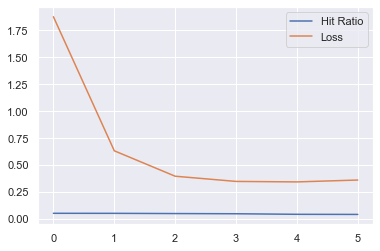

In [40]:
sns.set_style('darkgrid')
plt.plot(hr_list1, label = 'Hit Ratio')
plt.plot(loss_list1, label = 'Loss')
plt.legend()

In [41]:
model2.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
user_input (InputLayer)         [(None, 1)]          0                                            
__________________________________________________________________________________________________
item_input (InputLayer)         [(None, 1)]          0                                            
__________________________________________________________________________________________________
mlp_embedding_user (Embedding)  (None, 1, 15)        76530       user_input[0][0]                 
__________________________________________________________________________________________________
mlp_embedding_item (Embedding)  (None, 1, 15)        50910       item_input[0][0]                 
____________________________________________________________________________________________

In [42]:
mids = []
for i in range(len(testRatings)):
    mids.append(recommend(model2, 'mlp_embedding_user', 'mlp_embedding_item', i))

Getting reccomendations for user 17850.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 13047.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item 

Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 15862.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray

______


Getting reccomendations for user 16552.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17181.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item num

Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15922.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

______

Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 14496.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 14696.0:

-------------------------------------

Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15694.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion c


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 18041.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 15738.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for us

Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16186.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca rin


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17659.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item

Getting reccomendations for user 14236.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 17961.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 14680.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c:

Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 17198.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 17238.0:

-------------------------------------------------------------------------

Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 18055.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 20798: clear milkshake glass
Item numbe


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 15221.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudic

Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass

_______________________________________________________________________


Getting reccomendations for user 15555.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13034.0:


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 18219.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item nu


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15048.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17223.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16817.0:

-------------------------------------------------------------------------
--

Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 17450.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 17091.0:

-------------------------------------------------------------------------

Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 15965.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15024.0:

-------------------------------------------------------------------------
--------


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 12839.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item 

Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13842.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item nu


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17213.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri


Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13531.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudic


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 12721.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15288.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 15811.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
It

Getting reccomendations for user 17827.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16265.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16727.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84984a: green peony cushion cover
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Ite


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16367.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item numb

Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 13225.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook
I

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17375.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca rin

Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17194.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudi

Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 16145.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 17629.0:

-------------------------------------------------------------------------
-----------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 14913.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca rin


Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 13890.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction ho


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -3035.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17848.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 12705.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ri

Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 44092b: blue white plastic rings lampshade
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15527.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard s


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user -2975.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -2952.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item numbe

Getting reccomendations for user 13629.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16600.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user -2920.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ring


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 12480.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake gl


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16279.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item nu


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 18095.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item nu

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 15171.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item

Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user -2863.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item num

Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 14976.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendati


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13898.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item n

Getting reccomendations for user -2838.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 14916.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb


_______________________________________________________________________


Getting reccomendations for user 16618.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 17277.0:

-------------------------------------------------------------------------
------------------------------------------------------

Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -2819.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item 


Item number 47341a: fuschia table run flower
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 20798: clear milkshake glass

_______________________________________________________________________


Getting reccomendations for user -2810.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ring


Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 20798: clear milkshake glass
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 14049.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction ho

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 14970.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item numbe


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13709.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 20798: clear milkshake glass
Item number 9


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 17604.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13110.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item nu


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 17337.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20


_______________________________________________________________________


Getting reccomendations for user 17517.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17226.0:

-------------------------------------------------------------------------
------------------------------------------------------


Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 17774.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 84984a: green peony cushion cover
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item n

Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 17537.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio


Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user -2632.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17512.0:

-------------------------------------------------------------------------
---------

Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 13157.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 14644.0:

------------------------------

Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 16126.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendati

Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 44092b: blue white plastic rings lampshade

_______________________________________________________________________


Getting reccomendations for user 13085.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w hand


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 13744.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16913.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray

_______________________________________________

Getting reccomendations for user 16940.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 14289.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -2556.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item


Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 15951.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicc

Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16427.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item

Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -2539.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendati


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16709.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction ho


Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 15675.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 17654.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca r

Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 17639.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

___

Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 16625.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

______

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16768.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hoo


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user -2438.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 44092b: blue white plastic r


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 13268.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 13591.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w hand


Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 13985.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user -2396.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item numb


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 12818.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17754.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction ho


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 15624.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ri

Item number 47341a: fuschia table run flower
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user -2270.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hoo


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 17088.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item 

Getting reccomendations for user -2212.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 16180.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 14747.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
It

Getting reccomendations for user 14964.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 16031.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 14246.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction ho

Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 17550.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 15655.0:

-------------------------------------------------------------------------
--


Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16172.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction ho


Item number 47341a: fuschia table run flower
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass

_______________________________________________________________________


Getting reccomendations for user 17058.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 90162c: ant silver fuschia boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user -1997.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtra

Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 15491.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca rin

Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 16633.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13101.0:

---------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 12354.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item numbe


Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 15108.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ri

Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16637.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring



Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 13282.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suct

Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user -1808.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball 

Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 13723.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 14005.0:

--------------------------

Getting reccomendations for user 12821.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass

_______________________________________________________________________


Getting reccomendations for user -1773.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item 

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -1751.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicc


Item number 47341a: fuschia table run flower
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 20798: clear milkshake glass

_______________________________________________________________________


Getting reccomendations for user 13235.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 84984a: green peony cushion cover
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 15907.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 44092b: blue white plastic rings lampshade
Item 

Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 13976.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 16139.0:

----------------


Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16647.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20

Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 18048.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item 


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -1645.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake gla

Getting reccomendations for user -1603.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 14584.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15897.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction ho


Getting reccomendations for user 16484.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user -1572.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item num

Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16880.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
I


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 13283.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple

Getting reccomendations for user -1514.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -1513.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb

Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 17234.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item nu

Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass

_______________________________________________________________________


Getting reccomendations for user 14177.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations f

Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user -1435.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 16324.0:

------------------------------


Item number 84548: crochet bear redblue  keyring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 17562.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x2

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user -1378.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user -1359.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ri

Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 18112.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 


Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 15578.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item nu


Getting reccomendations for user -1264.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user -1262.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item num

Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user -1240.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendatio


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -1211.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball 


Getting reccomendations for user 13207.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 18122.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item


Item number 47341a: fuschia table run flower
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 44092b: blue white plastic rings lampshade

_______________________________________________________________________


Getting reccomendations for user 13933.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction ho


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 16762.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item n

Item number 47341a: fuschia table run flower
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 18143.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction ho

Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass

_______________________________________________________________________


Getting reccomendations for user 14100.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown bal


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 18237.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 44092b:

Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17053.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b

Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 15254.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 18099.0:

-------------------------------------------------------------------------
--------


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 16292.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring

Getting reccomendations for user 15706.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15480.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb

Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 12418.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 62043b: blue check bag w handl

Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 12642.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -879.0:

-------------------------------------------------------------------------
--

Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15074.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 12492.0:

------------------------------


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass

_______________________________________________________________________


Getting reccomendations for user 15690.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w h

Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 14067.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendati

Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user -771.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user -770.0:

-------------------------------------------------------------------------
-

Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 17317.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 14212.0:

-------------------------------

Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user -739.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item num

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13518.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item 

Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 18194.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook

_____________________________________________

Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user -674.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
I


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 16669.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm


Getting reccomendations for user 14652.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15807.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb

Getting reccomendations for user 13429.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15154.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb

Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 14412.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16119.0:

--------------------


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 16574.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Ite

Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16930.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio


Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 14184.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring

_____________________________________________________


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 12628.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 44092b: blue white plastic rings lampshade
It

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 14427.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring


Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 18088.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 84597b: retro brown ball ashtray
Item number 44092b: blue white plastic rings lampshade
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item num


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user -490.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hoo

Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 13464.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio


Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 16416.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item nu


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 16363.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Getting reccomendations for user 17549.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17973.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item 

Getting reccomendations for user -400.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook

_______________________________________________________________________


Getting reccomendations for user 15836.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
It

Getting reccomendations for user 15142.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 17344.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb

Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17712.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
I

Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user -346.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item numb


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 20798: clear milkshake glass
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 13822.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 47421: assorted colour lizard suction hook
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ri

Getting reccomendations for user 17668.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 62043b: blue check bag w handle 34x20cm
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 16971.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb

Getting reccomendations for user 13721.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 16322.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item numb


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 20798: clear milkshake glass
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15156.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca r

Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user 15957.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 62043b: blue check bag w handle 34x20cm
Item number 84597b: retro brown ball ashtray
Item number 84984a: green peony cushion cover

______

Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 15450.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendati

Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16433.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 62043b: blue check bag w handle 34x20cm
Ite


Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 90162d: ant silver purple boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17566.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ri

Item number 20798: clear milkshake glass
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm

_______________________________________________________________________


Getting reccomendations for user -197.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 84984a: green peony cushion cover
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 62043

Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray

_______________________________________________________________________


Getting reccomendations for user 17904.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio
Item number 84984a: green peony cushion cover
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user 17301.0:

----------------------------------------


_______________________________________________________________________


Getting reccomendations for user 17010.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 44092b: blue white plastic rings lampshade
Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 47421: assorted colour lizard suction hook
Item number 90162c: ant silver fuschia boudicca ring
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 84086b: yellowblue retro radio

_______________________________________________________________________


Getting reccomendations for user 15115.0:

-------------------------------------------------------------------------
------------------------------------------------------

Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user -134.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 84548: crochet bear redblue  keyring
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 84597b: retro brown ball ashtray
Item number 84086b: yellowblue retro radio
Item number 47421: assorted colour lizard suction hook
Item number 84984a: green peony cushion cover
Item number 62043b: blue check bag w handle 34x20cm
Item number 90162d: ant silver purple boudicca ring
Item number 90162c: ant silver fuschia boudicca ring

_______________________________________________________________________


Getting reccomendations for user -129.0:

-------------------------------------------------------------------------

Item number 20798: clear milkshake glass
Item number 90162d: ant silver purple boudicca ring
Item number 47421: assorted colour lizard suction hook
Item number 84086b: yellowblue retro radio
Item number 90162c: ant silver fuschia boudicca ring
Item number 84597b: retro brown ball ashtray
Item number 62043b: blue check bag w handle 34x20cm
Item number 84984a: green peony cushion cover

_______________________________________________________________________


Getting reccomendations for user 16024.0:

-------------------------------------------------------------------------
-------------------------------------------------------------------------

Item number 47341a: fuschia table run flower
Item number 20798: clear milkshake glass
Item number 44092b: blue white plastic rings lampshade
Item number 47421: assorted colour lizard suction hook
Item number 90162d: ant silver purple boudicca ring
Item number 84086b: yellowblue retro radio
Item number 84597b: retro brown ball ashtray
Item numbe

In [43]:
ndf_mf = pd.DataFrame(mids, columns =   ['Rec1', 'Rec2', 'Rec3', 'Rec4', 'Rec5', 'Rec6', 'Rec7', 'Rec8', 'Rec9', 'Rec10'])
ndf_mf

,Rec1,Rec2,Rec3,Rec4,Rec5,Rec6,Rec7,Rec8,Rec9,Rec10
0,3374,3281,1967,2206,3295,586,3103,3308,3246,3245
1,2526,3281,1967,3295,3245,586,3103,2206,3246,3308
2,2526,3281,1967,586,3308,3295,3245,3246,2206,3103
3,2526,3281,1967,3308,3295,2206,586,3103,3245,3246
4,2526,3281,1967,586,3295,3246,3103,3308,2206,3245
...,...,...,...,...,...,...,...,...,...,...
5000,2526,3281,1967,2206,3246,3245,3295,3103,586,3308
5001,2526,3103,2206,1967,3245,3295,586,3246,3281,3308
5002,2526,3281,1967,3103,3308,3246,3245,586,2206,3295
5003,2526,3281,1967,586,3103,2206,3246,3295,3308,3245


In [46]:
neural_coverage = set(ndf_mf.stack().to_list())
len(neural_coverage)/len(df_train.StockCode.unique())

0.0035356511490866236

### Neural Nets have higher Coverage.


## Trying ALS Model by training with Leave one Out.

In [47]:
nb_users = len(customer_map.items())
nb_articles = len(prod_map.items())
uim = np.zeros((nb_users, nb_articles), dtype=np.float32)
uim[df_train_group_map.CustomerID,df_train_group_map.StockCode] = df_train_group_map.bought ### Here comes the point that we only 
                                                                                     ### use the training data to make the
                                                                                     ### uim matrix

from scipy import sparse as sp
alpha = 40
uim = uim + uim * alpha
uim = sp.csr_matrix(uim.T) ### The API needs the rows to be items and the columns to be users 
print('uim shape : ',uim.shape)

from implicit.als import AlternatingLeastSquares

model = AlternatingLeastSquares(factors=256,use_gpu=False, iterations = 100, regularization = 0.01)
model.fit(item_users=uim)

assert(model.user_factors.shape[0] == len(customer_map))
assert(model.item_factors.shape[0] == len(prod_map))

### Evaluating
topK = 10
evaluation_threads = 1
testRatings, testNegatives = test_rating_map, negative_test_rating_map
time1 = time()
(hits, ndcgs) = evaluate_model(model, testRatings, testNegatives, topK, evaluation_threads,
                               eval_mode = 'ALS', uim = uim)
hr, ndcg = np.array(hits).mean(), np.array(ndcgs).mean()
print('HR = %.4f, NDCG = %.4f [%.1f s], alpha = %d' % (hr, ndcg, time()-time1, alpha))

uim shape :  (3394, 5102)



HR = 0.1794, NDCG = 0.0855 [19.3 s], alpha = 40


### Getting Coverage of ALS model

In [74]:
def get_keys(value, dictionary):
    """Function to get dictionary keys with specifiec value"""
    return list(dictionary.keys())[list(dictionary.values()).index(value)]

# recommend items for a user. 
# the recommended items have the largest inner product with the user vector
user_id = list(inverse_customer_map.keys())[5100]
recommendations = model.recommend(inverse_customer_map[user_id], uim.T)
list(map(lambda x: (get_keys(x[0], inverse_prod_map)), recommendations))

['22720',
 '22941',
 '21929',
 '22621',
 '23300',
 '22086',
 '22630',
 '23382',
 '22328',
 '23354']

In [76]:
# find related items
# the related items have the largest inner product with the item vector
mids = []
for i in range(len(inverse_customer_map)):
    user_id = list(inverse_customer_map.keys())[i]
    recommendations = model.recommend(inverse_customer_map[user_id], uim.T)
    mids.append(list(map(lambda x: (get_keys(x[0], inverse_prod_map)), recommendations)))

mids

[['82483',
  '82494l',
  '84029e',
  '82482',
  '22632',
  '21871',
  '84029g',
  '22752',
  '22633',
  '71053'],
 ['23298',
  '22692',
  '21900',
  '22961',
  '23112',
  '23245',
  '84879',
  '23110',
  '22423',
  '22274'],
 ['22992',
  '23508',
  '23108',
  '22328',
  '23084',
  '22613',
  '22333',
  '22355',
  '22556',
  '22331'],
 ['22086',
  '22423',
  '22077',
  '22457',
  '23351',
  '22084',
  '23354',
  '22952',
  '22961',
  '23319'],
 ['82484',
  '22845',
  '21672',
  '21669',
  '48188',
  '85066',
  '20685',
  '84879',
  '21755',
  '21754'],
 ['85099f',
  '21213',
  '22384',
  '21929',
  '84375',
  '20723',
  '21902',
  '21080',
  '21242',
  '21866'],
 ['23301',
  '23188',
  '23284',
  '22910',
  '22142',
  '22141',
  '22568',
  '84347',
  '22961',
  '22570'],
 ['21889',
  '23176',
  '22784',
  '22943',
  '22965',
  '23284',
  '20752',
  '21383',
  '22690',
  '21705'],
 ['22728',
  '22727',
  '22726',
  '22730',
  '22992',
  '22411',
  '22729',
  '22725',
  '22381',
  '20914'

In [77]:
als_mf = pd.DataFrame(mids, columns =   ['Rec1', 'Rec2', 'Rec3', 'Rec4', 'Rec5', 'Rec6', 'Rec7', 'Rec8', 'Rec9', 'Rec10'])
als_mf

,Rec1,Rec2,Rec3,Rec4,Rec5,Rec6,Rec7,Rec8,Rec9,Rec10
0,82483,82494l,84029e,82482,22632,21871,84029g,22752,22633,71053
1,23298,22692,21900,22961,23112,23245,84879,23110,22423,22274
2,22992,23508,23108,22328,23084,22613,22333,22355,22556,22331
3,22086,22423,22077,22457,23351,22084,23354,22952,22961,23319
4,82484,22845,21672,21669,48188,85066,20685,84879,21755,21754
...,...,...,...,...,...,...,...,...,...,...
5097,16238,22983,21791,22123,22759,22753,79321,22745,22219,21983
5098,47593b,82494l,22494,22383,22142,22596,22364,22371,22417,16238
5099,22835,23204,23205,22112,21479,23206,21484,22355,22114,22898
5100,22720,22941,21929,22621,23300,22086,22630,23382,22328,23354


In [79]:
#Coverage

als_coverage = set(als_mf.stack().to_list())
len(als_coverage)/len(df_train.StockCode.unique())

0.6879787860931055